In [ ]:
from google.colab import drive
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from matplotlib import rc

# 폰트깨짐 현상으로 인해 코렙 한글폰트 수동 설치
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf
plt.rc('font', family='NanumGothic')

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-nanum is already the newest version (20200506-1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.
/usr/share/fonts: caching, new cache contents: 0 fonts, 1 dirs
/usr/share/fonts/truetype: caching, new cache contents: 0 fonts, 3 dirs
/usr/share/fonts/truetype/humor-sans: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/fonts/truetype/liberation: caching, new cache contents: 16 fonts, 0 dirs
/usr/share/fonts/truetype/nanum: caching, new cache contents: 12 fonts, 0 dirs
/usr/local/share/fonts: caching, new cache contents: 0 fonts, 0 dirs
/root/.local/share/fonts: skipping, no such directory
/root/.fonts: skipping, no such directory
/usr/share/fonts/truetype: skipping, looped directory detected
/usr/share/fonts/truetype/humor-sans: skipping, looped directory detected
/usr/share/fonts/truetype/liberation: skipping, looped directory detected
/usr/share/fonts/truetype/

In [ ]:
# Google Drive 마운트
drive.mount('/content/drive')
train = pd.read_csv('/content/drive/MyDrive/Aiffel/transaction_price_data/train.csv') # 훈련 데이터 불러오기
test = pd.read_csv('/content/drive/MyDrive/Aiffel/transaction_price_data/test.csv') # 테스트 데이터 불러오기
park = pd.read_csv('/content/drive/MyDrive/Aiffel/transaction_price_data/park.csv') # 공원 데이터 불러오기
day_care_center = pd.read_csv('/content/drive/MyDrive/Aiffel/transaction_price_data/park.csv') # 어린이집 데이터 불러오기

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
train_copy = park.copy()
# 공원 데이터셋에서 필요한 변수들 선택
selected_columns = [
    'city', 'gu', 'dong', 'park_name', 'park_type', 'park_area',
    'park_exercise_facility', 'park_entertainment_facility',
    'park_benefit_facility','park_cultural_facitiy','park_facility_other', 'park_open_year', 'reference_date'
]
# 결측치 확인
print("park 데이터 Shape:")
print(train_copy.shape)

# 결측치 확인
print("park 데이터 결측치 개수:")
train_copy.isnull().sum()

# 결측치를 "Not available"로 대체
#park_copy[selected_columns] = park_copy[selected_columns].fillna("Not available")

# 결측치가 있는 행 삭제
#park_copy.dropna(inplace=True)

park 데이터 Shape:
(1359, 13)
park 데이터 결측치 개수:


city                              0
gu                                3
dong                              0
park_name                         0
park_type                         0
park_area                         0
park_exercise_facility         1082
park_entertainment_facility     924
park_benefit_facility          1093
park_cultural_facitiy          1287
park_facility_other            1184
park_open_year                  422
reference_date                    0
dtype: int64

In [ ]:
# 새로운 데이터프레임 생성
park_copy_selected = park_copy[selected_columns]

# Styler 클래스를 사용하여 스타일 적용
styled_df = park_copy_selected.style.set_properties(**{'text-align': 'center', 'font-size': '11pt'}) \
                                    .set_table_styles([{'selector': 'th', 'props': [('background-color', 'lightgrey')]}])

# Styler 객체를 출력
styled_df

In [ ]:
# 출력
print("원본 데이터프레임 크기:", park.shape)
print("스타일링된 데이터프레임 크기:", park_copy_selected.shape)
print("원본 데이터프레임 크기:", park_copy.shape)

원본 데이터프레임 크기: (1359, 13)
스타일링된 데이터프레임 크기: (1359, 13)
원본 데이터프레임 크기: (1359, 13)


In [ ]:
# 공원 종류 나열
park_types = park_copy['park_type'].unique()
print("공원 종류:")
print(park_types)

# 공원 종류별 개수 확인
park_type_counts = park_copy['park_type'].value_counts()
print("\n공원 종류별 개수:")
print(park_type_counts)

공원 종류:
['근린공원' '역사공원' '어린이공원' '묘지공원' '수변공원' '소공원' '문화공원' '체육공원' '기타' '도시농업공원']

공원 종류별 개수:
park_type
어린이공원     791
근린공원      330
소공원       163
기타         34
문화공원       18
역사공원       10
수변공원        6
체육공원        3
도시농업공원      3
묘지공원        1
Name: count, dtype: int64


In [ ]:
park_type_other = park_copy[park_copy['park_type'] == '묘지공원']

# 선택한 열만으로 새로운 데이터프레임 생성
park_other = park_type_other[selected_columns]

# Styler 클래스를 사용하여 스타일 적용
styled_df_2 = park_other.style.set_properties(**{'text-align': 'center', 'font-size': '11pt'}) \
                                    .set_table_styles([{'selector': 'th', 'props': [('background-color', 'lightgrey')]}])

# Styler 객체를 출력
styled_df_2

,city,gu,dong,park_name,park_type,park_area,park_exercise_facility,park_entertainment_facility,park_benefit_facility,park_cultural_facitiy,park_facility_other,park_open_year,reference_date
5,부산광역시,남구,대연동,UN공원,묘지공원,176486.000000,nan,nan,nan,nan,nan,1971.000000,2018-08-14


In [ ]:
park_copy = park_copy[park_copy['park_type'] != '묘지공원']

# 선택한 열만으로 새로운 데이터프레임 생성
park_copy_selected = park_copy[selected_columns]

# Styler 클래스를 사용하여 스타일 적용
styled_df = park_copy_selected.style.set_properties(**{'text-align': 'center', 'font-size': '11pt'}) \
                                    .set_table_styles([{'selector': 'th', 'props': [('background-color', 'lightgrey')]}])

# Styler 객체를 출력
styled_df

In [ ]:
# 공원 종류 나열
park_types = park_copy['park_type'].unique()
print("공원 종류:")
print(park_types)

# 공원 종류별 개수 확인
park_type_counts = park_copy['park_type'].value_counts()
print("\n공원 종류별 개수:")
print(park_type_counts)

공원 종류:
['근린공원' '역사공원' '어린이공원' '수변공원' '소공원' '문화공원' '체육공원' '기타' '도시농업공원']

공원 종류별 개수:
park_type
어린이공원     791
근린공원      330
소공원       163
기타         34
문화공원       18
역사공원       10
수변공원        6
체육공원        3
도시농업공원      3
Name: count, dtype: int64


In [ ]:
park_type_other = park_copy[park_copy['park_type'] == '기타']

# 선택한 열만으로 새로운 데이터프레임 생성
park_other = park_type_other[selected_columns]

# Styler 클래스를 사용하여 스타일 적용
styled_df_2 = park_other.style.set_properties(**{'text-align': 'center', 'font-size': '11pt'}) \
                                    .set_table_styles([{'selector': 'th', 'props': [('background-color', 'lightgrey')]}])

# Styler 객체를 출력
styled_df_2

,city,gu,dong,park_name,park_type,park_area,park_exercise_facility,park_entertainment_facility,park_benefit_facility,park_cultural_facitiy,park_facility_other,park_open_year,reference_date
494,서울특별시,강북구,미아동,북한산 도시자연공원,기타,128341.000000,배드민턴장 게이트볼장 족구장,그네 회전놀이 조합놀이대,화장실,nan,유아숲체험원,1971.000000,2018-08-01
595,서울특별시,은평구,신사동,신사동공공공지,기타,1848.000000,nan,nan,nan,nan,nan,1990.000000,2018-02-14
600,서울특별시,은평구,구산동,봉산도시자연공원<시공원>,기타,1512881.000000,"""운동장1, 축구장2, 농구장2, 배구장1, 배드민턴장8, 기타4""","""그네1, 시소2, 조합노이대3, 기타4""","""주차장1, 화장실2""",기타4,관리사무소2,1995.000000,2018-02-14
602,서울특별시,은평구,진관동,서오릉도시자연공원<시공원>,기타,1082847.000000,"""축구장1, 농구장1, 배드민턴장3""",기타7,"""주차장1, 화장실1""","""문화회관2, 야외음악당1, 기타3""",관리사무소1,1995.000000,2018-02-14
605,서울특별시,은평구,녹번동,북한산도시자연공원<시공원>,기타,730342.000000,"""배드민턴장1, 게이트볼장1, 기타2""",조합놀이대1,화장실1,기타2,관리사무소1,2000.000000,2018-02-14
606,서울특별시,은평구,수색동,수색마을마당,기타,387.000000,nan,유아용조합놀이대1,nan,nan,nan,2000.000000,2018-02-14
607,서울특별시,은평구,역촌동,역촌동마을마당,기타,230.100000,nan,nan,nan,nan,nan,2001.000000,2018-02-14
609,서울특별시,은평구,역촌동,역촌2동마을마당,기타,395.700000,nan,"""유아용조합놀이대1, 네트놀이대1, 석탑2, 돌기둥3, 모래놀이터1""",nan,nan,nan,2003.000000,2018-02-14
610,서울특별시,은평구,대조동,대조동청사옆마을마당,기타,130.300000,nan,nan,nan,nan,nan,2004.000000,2018-02-14
612,서울특별시,은평구,구산동,구산동마을공원,기타,2811.000000,nan,"""조합놀이대1, 모래놀이터1, 파이프놀이대3""",화장실,nan,nan,2005.000000,2018-02-14


In [ ]:
# 공원 종류별 개수 시각화
plt.figure(figsize=(15, 8))
park_type_counts.plot(kind='bar', color='skyblue')
plt.title('공원 종류별 개수')
plt.xlabel('공원 종류')
plt.ylabel('개수')
plt.xticks(rotation=45)
plt.show()

NameError: name 'park_type_counts' is not defined

<Figure size 1500x800 with 0 Axes>

In [ ]:
# 확인할 열들 선택
#columns_to_check = ['park_exercise_facility', 'park_entertainment_facility',
#                    'park_benefit_facility', 'park_cultural_facitiy',
#                    'park_facility_other']

# 데이터 유무에 따라 새 열 추가
#for col in columns_to_check:
#    park_copy[col] = park_copy[col].notnull().astype(bool)
    #park_copy.drop(columns=[col], inplace=True)  # 기존 열 삭제

# 결과 확인
#display(park_copy)

In [ ]:
# 새로운 데이터프레임 생성
park_copy_selected = park_copy[selected_columns]

# Styler 클래스를 사용하여 스타일 적용
styled_df = park_copy_selected.style.set_properties(**{'text-align': 'center', 'font-size': '11pt'}) \
                                    .set_table_styles([{'selector': 'th', 'props': [('background-color', 'lightgrey')]}])

# Styler 객체를 출력
styled_df

In [ ]:
# 결측치 확인
print("원본 데이터 결측치 개수:")
print(park_copy.isnull().sum())

원본 데이터 결측치 개수:
city                              0
gu                                3
dong                              0
park_name                         0
park_type                         0
park_area                         0
park_exercise_facility         1081
park_entertainment_facility     923
park_benefit_facility          1092
park_cultural_facitiy          1286
park_facility_other            1183
park_open_year                  422
reference_date                    0
dtype: int64


In [ ]:
# 결측치를 "Not available"로 대체
park_copy['park_open_year'] = park_copy['park_open_year'].fillna("Not available")

In [ ]:
# 'gu' 열에 결측치가 있는 행 출력
missing_gu_rows = park_copy[park_copy['gu'].isnull()]

# 출력
print("결측치가 있는 'gu' 열의 행:")
print(missing_gu_rows)

# 직접 값 입력
park_copy.at[565, 'gu'] = '중구'
park_copy.at[566, 'gu'] = '부산진'
park_copy.at[567, 'gu'] = '동래구'

# 출력
print("결측치가 있는 'gu' 열의 행:")
print(missing_gu_rows)

결측치가 있는 'gu' 열의 행:
      city   gu dong park_name park_type  park_area  \
565  부산광역시  NaN  영주동      중앙공원      근린공원  5020657.0   
566  부산광역시  NaN  초읍동    어린이대공원      근린공원  4947290.0   
567  부산광역시  NaN  온천동      금강공원      근린공원  3096579.0   

                                park_exercise_facility  \
565  "운동광장, 게이트볼, 궁도장, 구민운동장, 풋살경기장, 다목적 마당, 인라인스케이...   
566                                     "골프연습장, 배드민턴장"   
567                                        "배트민턴, 궁도장"   

      park_entertainment_facility  \
565               "어린이놀이터, 발물놀이터"   
566  "케이블카, 어린이유희시설, 가족유희시설, 짚라인"   
567      "유희시설, 삭도, 어드벤처, 숲속어드벤처"   

                                 park_benefit_facility  \
565  "주차장,화장실, 대중음식점,매점,전망대,다과점,치유센터,숲속요가장및 풍욕장, 낙상...   
566  "제1주차장, 전망대, 매점, 매점(기념품), 휴게음식점, 간이화장실,  공중화장실...   
567                           "공중화장실, 유스호스텔, 전망대, 주차장"   

                                 park_cultural_facitiy  \
565  "도서관, 기념비, 충혼탑, 장건상동상, 대한해협전승비, 자연보호헌장, 시민헌장, ...   
566  "동물원시설, 어린이회관, 학생수련회야영장,

In [ ]:
# 결측치 확인
print("원본 데이터 결측치 개수:")
print(park_copy.isnull().sum())

원본 데이터 결측치 개수:
city                              0
gu                                0
dong                              0
park_name                         0
park_type                         0
park_area                         0
park_exercise_facility         1081
park_entertainment_facility     923
park_benefit_facility          1092
park_cultural_facitiy          1286
park_facility_other            1183
park_open_year                    0
reference_date                    0
dtype: int64


In [ ]:
# 새로운 데이터프레임 생성
park_copy_selected = park_copy[selected_columns]

# Styler 클래스를 사용하여 스타일 적용
styled_df = park_copy_selected.style.set_properties(**{'text-align': 'center', 'font-size': '11pt'}) \
                                    .set_table_styles([{'selector': 'th', 'props': [('background-color', 'lightgrey')]}])

# Styler 객체를 출력
styled_df

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

# 나눔고딕 폰트 설정
font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
font_name = fm.FontProperties(fname=font_path).get_name()
print(font_name)  # 폰트 이름 확인
plt.rc('font', family=font_name)

# 경고 메시지 방지
import matplotlib as mpl
mpl.rcParams['axes.unicode_minus'] = False

import seaborn as sns
# 상자 그림을 통해 이상치 시각화
plt.figure(figsize=(8, 6))
sns.boxplot(x='park_area', data=park_copy)
plt.title('Box Plot of Park Area')
plt.xlabel('Park Area (square meters)')
plt.show()

NanumGothic


NameError: name 'park_copy' is not defined

<Figure size 800x600 with 0 Axes>

In [ ]:
park_seoul = park_copy[park_copy['city'] == '서울특별시']
park_busan = park_copy[park_copy['city'] == '부산광역시']

display(park_seoul)

,city,gu,dong,park_name,park_type,park_area,park_exercise_facility,park_entertainment_facility,park_benefit_facility,park_cultural_facitiy,park_facility_other,park_open_year,reference_date
58,서울특별시,서초구,반포동,반 포,근린공원,26092.2,NaN,NaN,NaN,NaN,NaN,1981.0,2018-06-30
59,서울특별시,서초구,양재동,방아다리1,근린공원,2870.8,NaN,NaN,NaN,NaN,NaN,1988.0,2018-06-30
60,서울특별시,서초구,양재동,방아다리2,근린공원,2934.3,NaN,NaN,NaN,NaN,NaN,1988.0,2018-06-30
61,서울특별시,서초구,양재동,양재천,근린공원,19258.0,NaN,NaN,NaN,NaN,NaN,1988.0,2018-06-30
62,서울특별시,서초구,양재동,마 방,근린공원,6546.6,NaN,NaN,NaN,NaN,NaN,1983.0,2018-06-30
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1354,서울특별시,구로구,천왕동,이펜시아어린이공원,어린이공원,1500.0,NaN,조합놀이 1기,NaN,NaN,NaN,2006.0,2019-02-25
1355,서울특별시,구로구,천왕동,개명소공원,소공원,5415.0,NaN,NaN,NaN,NaN,NaN,2006.0,2019-02-25
1356,서울특별시,구로구,천왕동,봉화대근린공원,근린공원,60975.0,NaN,NaN,NaN,NaN,NaN,2006.0,2019-02-25
1357,서울특별시,구로구,항동,푸른수목원,근린공원,100809.0,NaN,NaN,NaN,NaN,NaN,2005.0,2019-02-25


공원 종류:
['서초구' '양천구' '관악구' '동작구' '금천구' '종로구' '중구' '동대문구' '영등포구' '도봉구' '성동구' '강북구'
 '강동구' '은평구' '서대문구' '송파구' '중랑구' '노원구' '광진구' '용산구' '강남구' '강서구' '구로구']

공원 종류별 개수:
gu
송파구     147
강남구     132
강서구     109
서초구     107
은평구      79
서대문구     50
구로구      47
동작구      46
동대문구     41
용산구      32
성동구      23
강동구      23
관악구      21
중구       14
중랑구      11
광진구      11
금천구      10
강북구       9
영등포구      8
종로구       5
도봉구       2
노원구       2
양천구       1
Name: count, dtype: int64


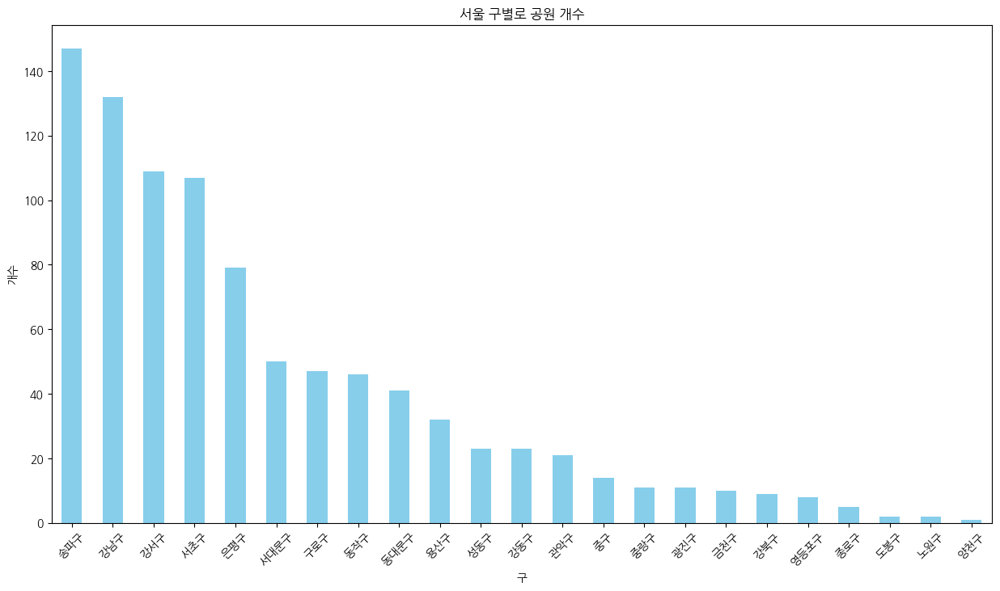

In [ ]:
# 서울 구 나열
park_seoul_gu = park_seoul['gu'].unique()
print("공원 종류:")
print(park_seoul_gu)

# 서울 구별 공원 개수 확인
park_seoul_gu_counts = park_seoul['gu'].value_counts()
print("\n공원 종류별 개수:")
print(park_seoul_gu_counts)

# 서울 구별로 개수 시각화
plt.figure(figsize=(15, 8))
park_seoul_gu_counts.plot(kind='bar', color='skyblue')
plt.title('서울 구별로 공원 개수')
plt.xlabel('구')
plt.ylabel('개수')
plt.xticks(rotation=45)
plt.show()

In [ ]:
display(park_busan)

,city,gu,dong,park_name,park_type,park_area,park_exercise_facility,park_entertainment_facility,park_benefit_facility,park_cultural_facitiy,park_facility_other,park_open_year,reference_date
0,부산광역시,남구,대연동,대연공원,근린공원,55227.0,NaN,NaN,NaN,NaN,NaN,1944.0,2018-08-14
1,부산광역시,남구,대연동,당곡공원,역사공원,75465.0,NaN,NaN,NaN,NaN,NaN,1944.0,2018-08-14
2,부산광역시,남구,대연동,대일어린이공원,어린이공원,422.1,NaN,NaN,NaN,NaN,NaN,1965.0,2018-08-14
3,부산광역시,남구,대연동,못골어린이공원,어린이공원,499.8,NaN,NaN,NaN,NaN,NaN,1968.0,2018-08-14
4,부산광역시,남구,용호동,솔밭어린이공원,어린이공원,1500.2,NaN,NaN,NaN,NaN,NaN,1970.0,2018-08-14
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1307,부산광역시,사상구,괘법동,사상공원,근린공원,622916.0,NaN,모험시설 등 22종 23점,NaN,NaN,파고라 외 9종 84점,1972.0,2019-03-21
1308,부산광역시,사상구,엄궁동,해름소공원,소공원,835.0,NaN,NaN,NaN,NaN,파고라 외 4종 14점,2008.0,2019-03-21
1309,부산광역시,사상구,모라동,모라벤처타워공원,소공원,735.8,NaN,NaN,NaN,NaN,평의자 외 2종 12점,2012.0,2019-03-21
1310,부산광역시,사상구,주례동,주감공원,소공원,1250.0,NaN,NaN,NaN,NaN,파고라 외 4종 7점,2013.0,2019-03-21


부산 구 종류:
['남구' '연제구' '부산진구' '북구' '중구' '영도구' '금정구' '동구' '해운대구' '부산진' '동래구' '강서구'
 '서구' '사하구' '수영구' '사상구']

부산 구별 공원 개수:
gu
북구      72
해운대구    46
동래구     46
강서구     39
남구      37
사하구     32
금정구     31
부산진구    30
사상구     30
연제구     20
영도구     14
수영구     14
서구      11
중구       3
동구       2
부산진      1
Name: count, dtype: int64


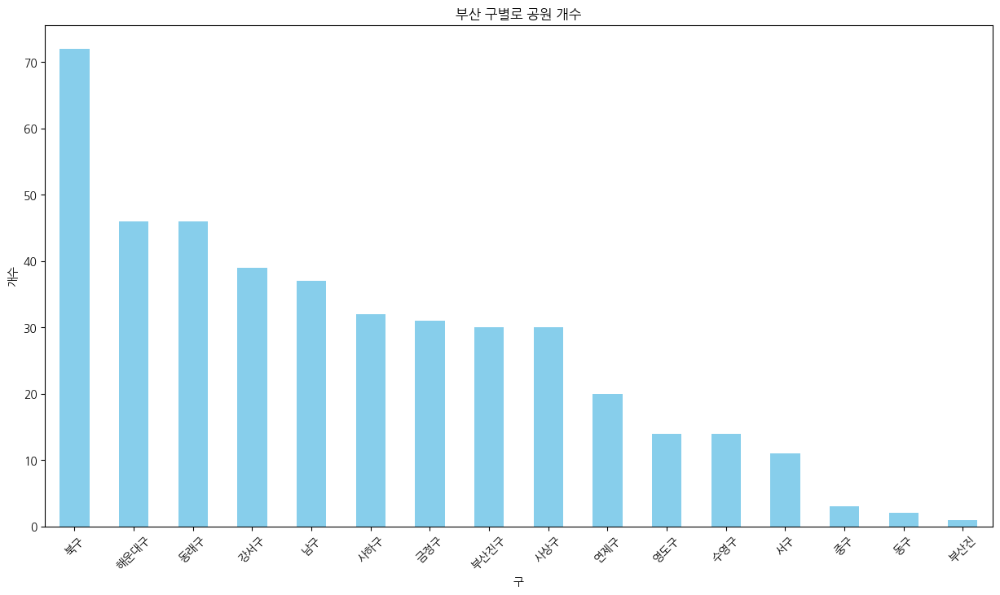

In [ ]:
# 부산 구 나열
park_busan_gu = park_busan['gu'].unique()
print("부산 구 종류:")
print(park_busan_gu)

# 부산 구별 공원 개수 확인
park_busan_gu_counts = park_busan['gu'].value_counts()
print("\n부산 구별 공원 개수:")
print(park_busan_gu_counts)

# 부산 구별로 개수 시각화
plt.figure(figsize=(15, 8))
park_busan_gu_counts.plot(kind='bar', color='skyblue')
plt.title('부산 구별로 공원 개수')
plt.xlabel('구')
plt.ylabel('개수')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# CSV 파일로 저장
# csv_file_path = 'park_data_filled.csv'
# park_copy.to_csv(csv_file_path, index=False)

In [ ]:
park_copy.head()

,city,gu,dong,park_name,park_type,park_area,park_exercise_facility,park_entertainment_facility,park_benefit_facility,park_cultural_facitiy,park_facility_other,park_open_year,reference_date
0,부산광역시,남구,대연동,대연공원,근린공원,55227.0,NaN,NaN,NaN,NaN,NaN,1944.0,2018-08-14
1,부산광역시,남구,대연동,당곡공원,역사공원,75465.0,NaN,NaN,NaN,NaN,NaN,1944.0,2018-08-14
2,부산광역시,남구,대연동,대일어린이공원,어린이공원,422.1,NaN,NaN,NaN,NaN,NaN,1965.0,2018-08-14
3,부산광역시,남구,대연동,못골어린이공원,어린이공원,499.8,NaN,NaN,NaN,NaN,NaN,1968.0,2018-08-14
4,부산광역시,남구,용호동,솔밭어린이공원,어린이공원,1500.2,NaN,NaN,NaN,NaN,NaN,1970.0,2018-08-14


In [ ]:
park_copy.columns
facility_cols = ['park_exercise_facility', 'park_entertainment_facility', 'park_benefit_facility', 'park_cultural_facitiy', 'park_facility_other']
for col in facility_cols:
    park_copy.loc[park_copy[col].notnull(), col] = 1
    park_copy.loc[park_copy[col].isnull(), col] = 0

In [ ]:
display(park_copy)

,city,gu,dong,park_name,park_type,park_area,park_exercise_facility,park_entertainment_facility,park_benefit_facility,park_cultural_facitiy,park_facility_other,park_open_year,reference_date
0,부산광역시,남구,대연동,대연공원,근린공원,55227.0,0,0,0,0,0,1944.0,2018-08-14
1,부산광역시,남구,대연동,당곡공원,역사공원,75465.0,0,0,0,0,0,1944.0,2018-08-14
2,부산광역시,남구,대연동,대일어린이공원,어린이공원,422.1,0,0,0,0,0,1965.0,2018-08-14
3,부산광역시,남구,대연동,못골어린이공원,어린이공원,499.8,0,0,0,0,0,1968.0,2018-08-14
4,부산광역시,남구,용호동,솔밭어린이공원,어린이공원,1500.2,0,0,0,0,0,1970.0,2018-08-14
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1354,서울특별시,구로구,천왕동,이펜시아어린이공원,어린이공원,1500.0,0,1,0,0,0,2006.0,2019-02-25
1355,서울특별시,구로구,천왕동,개명소공원,소공원,5415.0,0,0,0,0,0,2006.0,2019-02-25
1356,서울특별시,구로구,천왕동,봉화대근린공원,근린공원,60975.0,0,0,0,0,0,2006.0,2019-02-25
1357,서울특별시,구로구,항동,푸른수목원,근린공원,100809.0,0,0,0,0,0,2005.0,2019-02-25


In [ ]:
# 결측치 확인
print("원본 데이터 결측치 개수:")
print(park_copy.isnull().sum())

원본 데이터 결측치 개수:
city                           0
gu                             0
dong                           0
park_name                      0
park_type                      0
park_area                      0
park_exercise_facility         0
park_entertainment_facility    0
park_benefit_facility          0
park_cultural_facitiy          0
park_facility_other            0
park_open_year                 0
reference_date                 0
dtype: int64


In [ ]:
# 서울/부산 각 동별 공원 총 합계
# 동별 공원 수
park_dong = park_copy.groupby(['city', 'gu', 'dong'], as_index=False)['park_name'].count()
park_dong.rename({'park_name':'공원수'}, axis=1, inplace=True)

# 동별 공원에 배치된 facility 수
park_facility_dong = park_copy.groupby(['city', 'gu', 'dong'], as_index=False)[facility_cols].sum()


park_copy_selected = park_dong
styled_df = park_copy_selected.style.set_properties(**{'text-align': 'center', 'font-size': '11pt'}) \
                                   .set_table_styles([{'selector': 'th', 'props': [('background-color', 'lightgrey')]}])
styled_df

,city,gu,dong,공원수
0,부산광역시,강서구,녹산동,1
1,부산광역시,강서구,대저1동,1
2,부산광역시,강서구,명지동,25
3,부산광역시,강서구,송정동,2
4,부산광역시,강서구,신호동,4
5,부산광역시,강서구,지사동,6
6,부산광역시,금정구,구서동,5
7,부산광역시,금정구,금사동,6
8,부산광역시,금정구,남산동,6
9,부산광역시,금정구,부곡동,5


In [ ]:
# 서울 / 부산 각 동별 Facility 총 합계
park_copy_selected = park_facility_dong

styled_df_2 = park_copy_selected.style.set_properties(**{'text-align': 'center', 'font-size': '11pt'}) \
                                    .set_table_styles([{'selector': 'th', 'props': [('background-color', 'lightgrey')]}])
styled_df_2

,city,gu,dong,park_exercise_facility,park_entertainment_facility,park_benefit_facility,park_cultural_facitiy,park_facility_other
0,부산광역시,강서구,녹산동,1,0,1,0,1
1,부산광역시,강서구,대저1동,1,0,0,0,1
2,부산광역시,강서구,명지동,13,17,4,0,25
3,부산광역시,강서구,송정동,2,0,2,0,2
4,부산광역시,강서구,신호동,2,3,1,0,3
5,부산광역시,강서구,지사동,6,4,1,0,6
6,부산광역시,금정구,구서동,0,5,0,0,0
7,부산광역시,금정구,금사동,2,3,1,0,0
8,부산광역시,금정구,남산동,0,5,0,0,0
9,부산광역시,금정구,부곡동,0,4,0,0,0


In [ ]:
sum = park_copy.groupby(['city', 'gu', 'dong'], as_index=False)['park_area'].sum()
avg = park_copy.groupby(['city', 'gu', 'dong'], as_index=False)['park_area'].mean()
sum.rename(columns={'park_area': '면적합'}, inplace=True)
avg.rename(columns={'park_area': '면적평균'}, inplace=True)

park_dong = park_copy.groupby(['city', 'gu', 'dong'], as_index=False)['park_name'].count()
park_dong.rename({'park_name':'공원수'}, axis=1, inplace=True)
park_dong['공원수'] = park_dong['공원수'].astype(float)

park_dong_area = pd.merge(sum, avg, on=['city', 'gu', 'dong'])
park_dong_area = pd.merge(park_dong, park_dong_area, on=['city', 'gu', 'dong'])
park_dong_area = pd.merge(park_facility_dong, park_dong_area, on=['city', 'gu', 'dong'])

park_dong_area['면적평균'] = park_dong_area['면적평균'].apply(lambda x: '{:.2f}'.format(x))

columns_to_check = ['park_exercise_facility', 'park_entertainment_facility',
                    'park_benefit_facility', 'park_cultural_facitiy',
                    'park_facility_other']
park_dong_area[columns_to_check] = park_dong_area[columns_to_check].astype(float)
display(park_dong_area)

,city,gu,dong,park_exercise_facility,park_entertainment_facility,park_benefit_facility,park_cultural_facitiy,park_facility_other,공원수,면적합,면적평균
0,부산광역시,강서구,녹산동,1.0,0.0,1.0,0.0,1.0,1.0,12211.9,12211.90
1,부산광역시,강서구,대저1동,1.0,0.0,0.0,0.0,1.0,1.0,646.0,646.00
2,부산광역시,강서구,명지동,13.0,17.0,4.0,0.0,25.0,25.0,348482.8,13939.31
3,부산광역시,강서구,송정동,2.0,0.0,2.0,0.0,2.0,2.0,57560.0,28780.00
4,부산광역시,강서구,신호동,2.0,3.0,1.0,0.0,3.0,4.0,69323.0,17330.75
...,...,...,...,...,...,...,...,...,...,...,...
240,서울특별시,중구,충무로5가,0.0,1.0,1.0,0.0,0.0,1.0,3907.0,3907.00
241,서울특별시,중구,황학동,0.0,1.0,1.0,0.0,0.0,1.0,1087.0,1087.00
242,서울특별시,중랑구,면목동,0.0,0.0,0.0,0.0,0.0,2.0,2801845.8,1400922.90
243,서울특별시,중랑구,묵동,0.0,0.0,0.0,0.0,0.0,2.0,1144.7,572.35


In [ ]:
# CSV 파일로 저장
csv_file_path = 'park_dong_area.csv'
park_dong_area.to_csv(csv_file_path, index=False)

In [ ]:
park_copy_selected = park_dong_area
styled_df_3 = park_copy_selected.style.set_properties(**{'text-align': 'center', 'font-size': '11pt'}) \
                                    .set_table_styles([{'selector': 'th', 'props': [('background-color', 'lightgrey')]}])
styled_df_3

,city,gu,dong,park_exercise_facility,park_entertainment_facility,park_benefit_facility,park_cultural_facitiy,park_facility_other,공원수,면적합,면적평균
0,부산광역시,강서구,녹산동,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,12211.900000,12211.90
1,부산광역시,강서구,대저1동,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,646.000000,646.00
2,부산광역시,강서구,명지동,13.000000,17.000000,4.000000,0.000000,25.000000,25.000000,348482.800000,13939.31
3,부산광역시,강서구,송정동,2.000000,0.000000,2.000000,0.000000,2.000000,2.000000,57560.000000,28780.00
4,부산광역시,강서구,신호동,2.000000,3.000000,1.000000,0.000000,3.000000,4.000000,69323.000000,17330.75
5,부산광역시,강서구,지사동,6.000000,4.000000,1.000000,0.000000,6.000000,6.000000,53625.000000,8937.50
6,부산광역시,금정구,구서동,0.000000,5.000000,0.000000,0.000000,0.000000,5.000000,8643.000000,1728.60
7,부산광역시,금정구,금사동,2.000000,3.000000,1.000000,0.000000,0.000000,6.000000,135081.900000,22513.65
8,부산광역시,금정구,남산동,0.000000,5.000000,0.000000,0.000000,0.000000,6.000000,15432.600000,2572.10
9,부산광역시,금정구,부곡동,0.000000,4.000000,0.000000,0.000000,0.000000,5.000000,10676.000000,2135.20


In [ ]:
from sklearn.preprocessing import MinMaxScaler

new_row = {
    'city' : '서울특별시',
    'gu' : '강남구',
    'dong' : '서초동',
    'park_exercise_facility': 0,
    'park_entertainment_facility': 0,
    'park_benefit_facility': 0,
    'park_cultural_facitiy': 0,
    'park_facility_other': 0,
    '공원수': 0.0000,
    '면적합': 0,
    '면적평균': 0
}

# 행
cols = ['park_exercise_facility', 'park_entertainment_facility',
                 'park_benefit_facility', 'park_cultural_facitiy',
                 'park_facility_other', '공원수', '면적합', '면적평균']

# Min-Max Scaling 적용
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(park_dong_area[cols])

# 결과 데이터프레임에 반영
park_dong_area[cols] = scaled_data
#display(park_dong_area)

park_copy_selected = park_dong_area

display(park_dong_area)
#styled_df_3 = park_copy_selected.style.set_properties(**{'text-align': 'center', 'font-size': '11pt'}) \
#                                    .set_table_styles([{'selector': 'th', 'props': [('background-color', 'lightgrey')]}])
#styled_df_3

,city,gu,dong,park_exercise_facility,park_entertainment_facility,park_benefit_facility,park_cultural_facitiy,park_facility_other,공원수,면적합,면적평균
0,부산광역시,강서구,녹산동,0.052632,0.000000,0.052632,0.0,0.04,0.000000,0.001810,0.001810
1,부산광역시,강서구,대저1동,0.052632,0.000000,0.000000,0.0,0.04,0.000000,0.000082,0.000082
2,부산광역시,강서구,명지동,0.684211,1.000000,0.210526,0.0,1.00,0.800000,0.052055,0.002069
3,부산광역시,강서구,송정동,0.105263,0.000000,0.105263,0.0,0.08,0.033333,0.008586,0.004286
4,부산광역시,강서구,신호동,0.105263,0.176471,0.052632,0.0,0.12,0.100000,0.010344,0.002575
...,...,...,...,...,...,...,...,...,...,...,...
246,서울특별시,강남구,서초동,0.000000,0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.000000
247,서울특별시,강남구,서초동,0.000000,0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.000000
248,서울특별시,강남구,서초동,0.000000,0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.000000
249,서울특별시,강남구,서초동,0.000000,0.000000,0.000000,0.0,0.00,0.000000,0.000000,0.000000


In [ ]:
# CSV 파일로 저장
# csv_file_path = 'park_dong_area.csv'
# park_dong_area.to_csv(csv_file_path, index=False)

park_dong_area[park_dong_area['공원수']== 0]

,city,gu,dong,park_exercise_facility,park_entertainment_facility,park_benefit_facility,park_cultural_facitiy,park_facility_other,공원수,면적합,면적평균
0,부산광역시,강서구,녹산동,0.052632,0.000000,0.052632,0.0,0.04,0.0,0.001810,0.001810
1,부산광역시,강서구,대저1동,0.052632,0.000000,0.000000,0.0,0.04,0.0,0.000082,0.000082
10,부산광역시,금정구,서동,0.000000,0.058824,0.000000,0.0,0.04,0.0,0.000158,0.000158
12,부산광역시,금정구,청룡동,0.000000,0.058824,0.052632,0.0,0.00,0.0,0.000204,0.000204
17,부산광역시,남구,용당동,0.000000,0.000000,0.000000,0.0,0.00,0.0,0.000726,0.000726
...,...,...,...,...,...,...,...,...,...,...,...
246,서울특별시,강남구,서초동,0.000000,0.000000,0.000000,0.0,0.00,0.0,0.000000,0.000000
247,서울특별시,강남구,서초동,0.000000,0.000000,0.000000,0.0,0.00,0.0,0.000000,0.000000
248,서울특별시,강남구,서초동,0.000000,0.000000,0.000000,0.0,0.00,0.0,0.000000,0.000000
249,서울특별시,강남구,서초동,0.000000,0.000000,0.000000,0.0,0.00,0.0,0.000000,0.000000


In [ ]:
park_dong_area = pd.concat([park_dong_area, pd.DataFrame([new_row])], ignore_index=True)

styled_df_3 = park_copy_selected.style.set_properties(**{'text-align': 'center', 'font-size': '11pt'}) \
                                    .set_table_styles([{'selector': 'th', 'props': [('background-color', 'lightgrey')]}])
styled_df_3


,city,gu,dong,park_exercise_facility,park_entertainment_facility,park_benefit_facility,park_cultural_facitiy,park_facility_other,공원수,면적합,면적평균
0,부산광역시,강서구,녹산동,0.052632,0.000000,0.052632,0.000000,0.040000,0.000000,0.001810,0.001810
1,부산광역시,강서구,대저1동,0.052632,0.000000,0.000000,0.000000,0.040000,0.000000,0.000082,0.000082
2,부산광역시,강서구,명지동,0.684211,1.000000,0.210526,0.000000,1.000000,0.800000,0.052055,0.002069
3,부산광역시,강서구,송정동,0.105263,0.000000,0.105263,0.000000,0.080000,0.033333,0.008586,0.004286
4,부산광역시,강서구,신호동,0.105263,0.176471,0.052632,0.000000,0.120000,0.100000,0.010344,0.002575
5,부산광역시,강서구,지사동,0.315789,0.235294,0.052632,0.000000,0.240000,0.166667,0.007998,0.001321
6,부산광역시,금정구,구서동,0.000000,0.294118,0.000000,0.000000,0.000000,0.133333,0.001277,0.000244
7,부산광역시,금정구,금사동,0.105263,0.176471,0.052632,0.000000,0.000000,0.166667,0.020169,0.003350
8,부산광역시,금정구,남산동,0.000000,0.294118,0.000000,0.000000,0.000000,0.166667,0.002292,0.000370
9,부산광역시,금정구,부곡동,0.000000,0.235294,0.000000,0.000000,0.000000,0.133333,0.001581,0.000305
